# Data exploration

## Import libraries required

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

## Load data into Pandas DataFrames

In [2]:
calories_df = pd.read_csv('../input/calories.csv')
exercise_df = pd.read_csv('../input/exercise.csv')

In [3]:
calories_df.head()

,User_ID,Calories
0,14733363,231.0
1,14861698,66.0
2,11179863,26.0
3,16180408,71.0
4,17771927,35.0


In [4]:
exercise_df.head()

,User_ID,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp
0,14733363,male,68,190.0,94.0,29.0,105.0,40.8
1,14861698,female,20,166.0,60.0,14.0,94.0,40.3
2,11179863,male,69,179.0,79.0,5.0,88.0,38.7
3,16180408,female,34,179.0,71.0,13.0,100.0,40.5
4,17771927,female,27,154.0,58.0,10.0,81.0,39.8


As we can observe from both the data frames that we can merge both on 'User_ID' column.

## Merge both the dataframes

In [5]:
df = pd.merge(exercise_df, calories_df, on='User_ID')

In [6]:
df.head()

,User_ID,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
0,14733363,male,68,190.0,94.0,29.0,105.0,40.8,231.0
1,14861698,female,20,166.0,60.0,14.0,94.0,40.3,66.0
2,11179863,male,69,179.0,79.0,5.0,88.0,38.7,26.0
3,16180408,female,34,179.0,71.0,13.0,100.0,40.5,71.0
4,17771927,female,27,154.0,58.0,10.0,81.0,39.8,35.0


## Remove 'User_ID' column in merged dataframe

In [7]:
df.drop('User_ID', axis=1, inplace=True)

In [8]:
df.head()

,Gender,Age,Height,Weight,Duration,Heart_Rate,Body_Temp,Calories
0,male,68,190.0,94.0,29.0,105.0,40.8,231.0
1,female,20,166.0,60.0,14.0,94.0,40.3,66.0
2,male,69,179.0,79.0,5.0,88.0,38.7,26.0
3,female,34,179.0,71.0,13.0,100.0,40.5,71.0
4,female,27,154.0,58.0,10.0,81.0,39.8,35.0


## Explore data using visualization

### Gender (Categorical data)

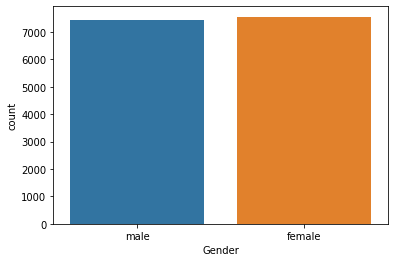

In [11]:
sns.countplot('Gender', data=df)
plt.show()

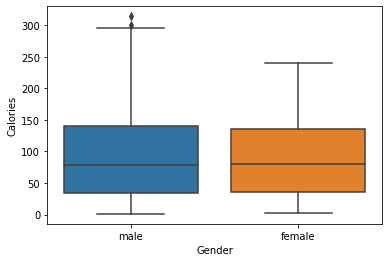

In [15]:
sns.boxplot(y='Calories', x='Gender', data=df)
plt.show()

### Age (Numerical data)

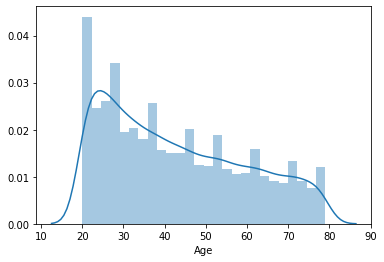

In [16]:
sns.distplot(df['Age'])
plt.show()

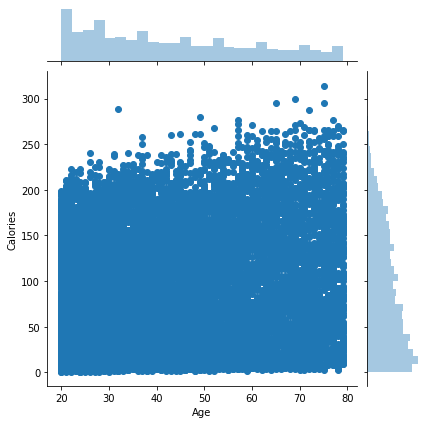

In [17]:
sns.jointplot(x='Age', y='Calories', data=df)
plt.show()

Define a function to go through each numerical column.

In [22]:
num_cols = df.select_dtypes(include=np.number).columns.tolist()
del num_cols[-1]

In [31]:
def plot_numeric_col(col_name):
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 6))
    fig.suptitle(f'Plots for Col:{col_name}')

    sns.distplot(df[col_name], ax=ax1)
    ax1.set_title('Distribution plot')
    sns.regplot(x=col_name, y='Calories', data=df, ax=ax2)
    ax2.set_title(f'{col_name} vs Calories')
    
    plt.show()

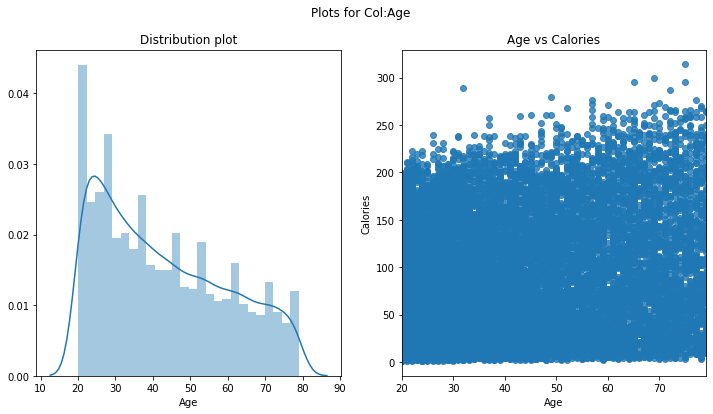

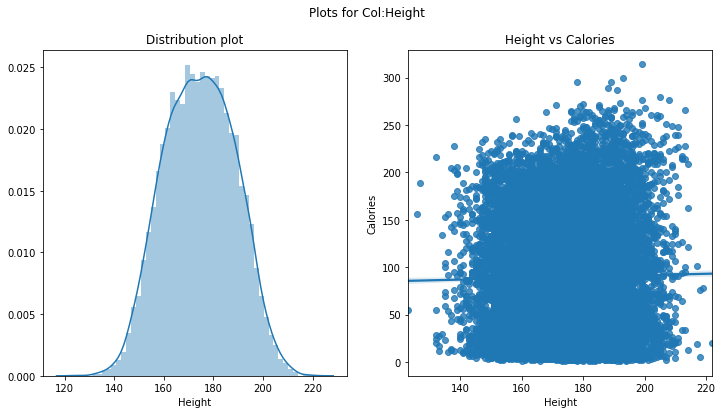

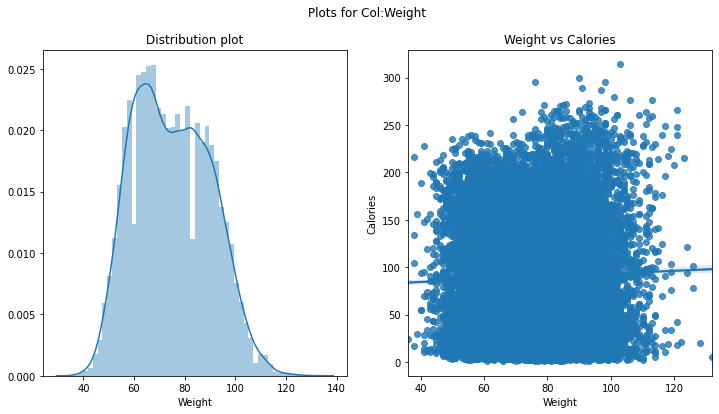

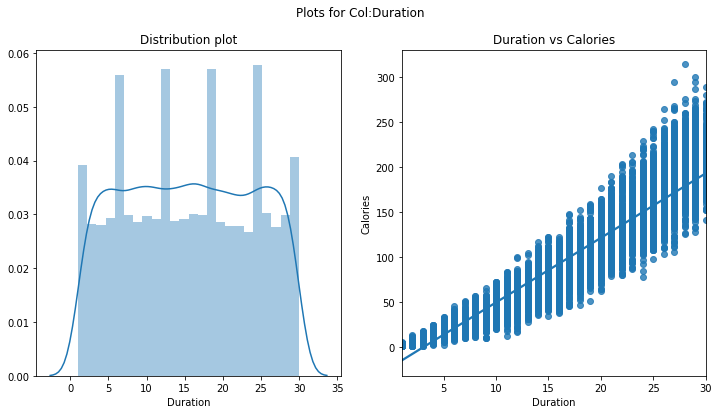

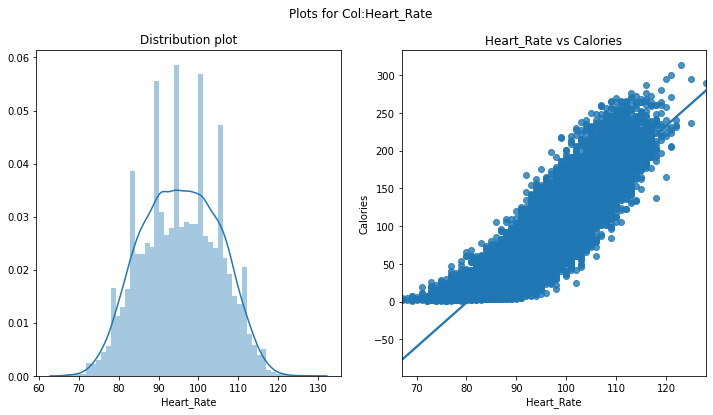

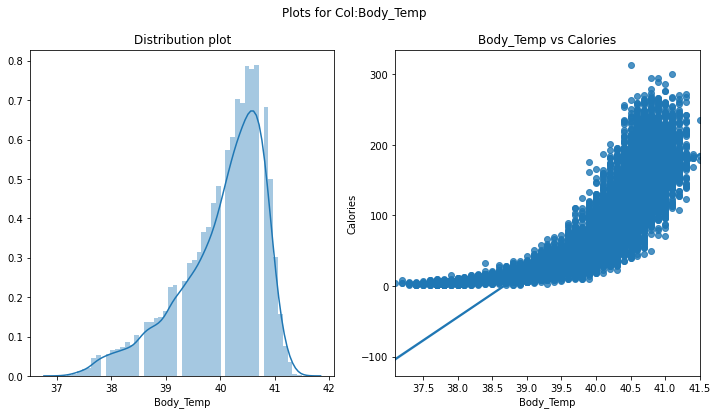

In [32]:
for col in num_cols:
    plot_numeric_col(col)

Observing above plots, 'Duration', 'Heart_Rate', 'Body_Temp' looks most relevant columns in the dataset to predict 'Calories'.